COLAB read LINK: https://colab.research.google.com/drive/1paE2_mPBC8CfVApNdVcVFARDXYh1f9fa?usp=sharing

# ***-1 -*** **OpenFoodFacts : About this Project**

## *A -* Introduction

The aim if this project is to create an application than can use the data of the **OpenFoodFacts** open database.

"*Open Food Facts gathers information and data on food products from around the world.*"
*https://world.openfoodfacts.org/*

In this project, we will clean and explore the OpenFoodFacts database to evaluate the feasability of our application.

This project is divided into two notebooks:
* In the first notebook, we will clean and filter the OpenFoodfacts data which is constituted of around 2 millions samples.
* In the second notebook we will statistically explore the filtered dataset in order to evaluate the feasability of our application.

In addition, we will also focus on creating tools to automate the exploration of datasets, whichever they are. This will enable us to quickly and efficiently explore datasets, in a transverse way, in the future.

This project is part of my ***OpenClassrooms-CentraleSupelec Machine Learning Engineer*** curriculum.

## *B -* How to Read this Project

### *a -* Notebooks

This project is divided into two notebooks:

 * **Cleaning** (*first notebook*): chapters 1, 2, 3 & 4
 * **Exploration** (*second notebook*): chapters 5 & 6

### *b -* Chapters

Each notebook is organized in chapters:

* ***-1 -*** **About this project** is *what you are reading now*. This is the *README*.
* ***0 -*** **Environment**: sets up the necessary environment to run this notebook. In this part, we will also develop the toolbox to automate the exploration of the dataset. *Disclaimer: This part is not really about Data Science, but more about code and automatized processing. It is not necessary to read this part unless you have a good knowledge of python and are interested on how I delevelopped these functions. Fee free to skip it.*

*First Notebook*
* ***1 -*** **Dataset Description**: describes the raw *data* of *OpenFoodFacts*
* ***2 -*** **Application Concept**: a short brief, we will present our application concept.
* ***3 -*** **Dataset Cleaning**: cleans the database in order to obtain useable data for our data exploration and application.
* ***4 -*** **Dataset Cleaning Conclusions**

*Second Notebook*
* ***5 -*** **Exploratory Analysis**: we perform the Exploratory Analysis.
* ***6 -*** **Exploratory Analysis Conclusions**

## *B -* Mouting Google Drive

In order to load the data which has been downloaded from OpenFoodFacts and uploaded to my personnal drive, we need to mount the Google Drive instance.

In [196]:
from google.colab import drive
drive.mount('/content/gdrive') # link to be updated

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# ***0 -*** **Environment**

## *A -* Importing Libraries

Let's import the libraries that will be used in this project.

In [197]:
import pandas as pd
!pip install sweetviz
import sweetviz as sv
import missingno
import plotly.express as px
import plotly.graph_objects as go
import re
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import numpy as np
from wordcloud import WordCloud
from sklearn.impute import KNNImputer
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.decomposition import PCA
from keras.models import Sequential
from keras.layers import Dense
from sklearn.preprocessing import MinMaxScaler, QuantileTransformer, StandardScaler
from sklearn.metrics import accuracy_score, mean_squared_error
import plotly.figure_factory as ff
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

## *B -* Utilities

### *a -* Dataset Versioning

I have developped the **Dataset()** class during this project as a simple dataset versioning tool.

*You can skip this part in you are not interested in code.*

In [198]:
class Dataset():


  def __init__(self, dataframe:pd.DataFrame):

    init_name = 'original'
    self.versions_index = {init_name:0}
    self.versions = {0:self.dict_constructor(dataframe=dataframe, step=init_name, index=0)}
    self.current_version = 0

    print(f'Version {self.current_version}: "{init_name}" initialized') 


  def last_index(self):

    return list(self.versions_index.values())[-1]


  def add_index(self, step, index):

    if step in list(self.versions_index.keys()) or step=='current':
      print('\nKey already in index, choose another key.\n')
      return False

    else:
      self.versions_index[step] = index
      return True


  def dict_constructor(self, dataframe, step, index):

    if index == 0:
      samples_diff = dataframe.shape[0]
      features_diff = dataframe.shape[1]
      index_diff = dataframe.index
      columns_diff = dataframe.columns

    else:
      last_version = self.versions.get(index-1)
      samples_diff = last_version.get('samples') - dataframe.shape[0]
      features_diff = last_version.get('features') - dataframe.shape[1]
      index_diff = last_version.get('index').difference(dataframe.index)
      columns_diff = last_version.get('columns').difference(dataframe.columns)

    dataframe_dict = {
      'name': step,
      'dataframe': dataframe,
      'samples': dataframe.shape[0],
      'samples_diff': samples_diff,
      'features': dataframe.shape[1],
      'features_diff': features_diff,
      'index': dataframe.index,
      'index_diff': index_diff,
      'columns': dataframe.columns,
      'columns_diff': columns_diff
    }

    return dataframe_dict


  def save_version(self, updated_dataframe:pd.DataFrame, step:str):

    next_version = self.last_index() + 1
    key_pass = self.add_index(step=step, index=next_version)
    if key_pass == True:
      self.versions[next_version] = self.dict_constructor(dataframe=updated_dataframe, step=step, index=next_version)
      self.current_version = next_version
      print(f'\nVersion {next_version}: "{step}" saved\n')    


  def parse_step(self, step):

    if type(step) == str:
      version_index = self.versions_index.get(step)
      version_name = step
    if type(step) == int:
      version_index = step
      version_name = self.versions.get(version_index).get('name')
    return version_index, version_name


  def get_version(self, step):

    version_index, version_name = self.parse_step(step)

    return self.versions.get(version_index)


  def delete_version(self, step):

    version_index, version_name = self.parse_step(step)
    del self.versions_index[version_name]
    del self.versions[version_index]

    print(f'\nVersion {version_index}: "{version_name}" deleted\n')


  def pull_features(self, features, step=0):

    return self.get_version(self.current_version).get('dataframe').join(self.get_version(step).get('dataframe')[features], how='inner')


  def get(self, item='dataframe', step='current'):

    if step == 'current': version = self.versions.get(self.current_version)
    elif step == 'latter': version = self.versions.get(self.current_version-1)
    else: version = self.get_version(step)

    try: 
      item = version.get(item)
      return item
    except KeyError: 
      print('\nKey error, try generating the item first.\n')


  def num_report(self, fig_fill_min:float):

    dataframe = self.get()

    samples = dataframe.shape[0]
    report = dataframe.select_dtypes([int, float, 'datetime']).describe().transpose()
    report['fill_%'] = ((report['count'] / samples) * 100).astype(float).round(2)
    report['nans'] = dataframe.isna().sum()
    report['nans_%'] = ((report['nans'] / samples) * 100).astype(float).round(2)

    for i in report.index:
      zeroes_count = dataframe[i][dataframe[i] == 0].shape[0]
      report.loc[i, 'zeroes'] = zeroes_count
      report.loc[i, 'zeroes_%'] = round(((zeroes_count / samples) * 100), 2)

    report = report[['count', 'fill_%', 'nans', 'nans_%','zeroes', 'zeroes_%','mean', 'std', 'min', '25%', '50%', '75%', 'max']]
    report = report.sort_values(by='count', ascending=False).rename_axis(mapper='feature', axis=0)
    report_df = report[report['fill_%'] >= fig_fill_min][['fill_%', 'nans_%', 'zeroes_%']].transpose()
    report_fig = go.Figure(data=[go.Bar(name=str(report_df.index[index]), x=list(report_df.columns.values), y=list(report_df.iloc[index,:].values)) for index in range(report_df.shape[0])])

    if fig_fill_min == 0: title = 'numerical features characteristics'
    else: title = f'numerical features characteristics (fill >= {fig_fill_min}%: {report_df.shape[1]})'

    report_fig.update_layout(title=title)
    report_fig.show()

    self.versions[self.current_version]['numericals'] = report


  def cat_report(self, fig_fill_min:float):

    dataframe = self.get()

    samples = dataframe.shape[0]
    report = dataframe.select_dtypes('object').describe().transpose()
    report['fill_%'] = ((report['count'] / samples) * 100).astype(float).round(2)
    report['uniques_%'] = ((report['unique'] / samples) * 100).astype(float).round(2)
    report['nans'] = dataframe.isna().sum()
    report['nans_%'] = ((report['nans'] / samples) * 100).astype(float).round(2)
    report = report[['count', 'fill_%', 'unique', 'uniques_%', 'nans', 'nans_%', 'top', 'freq']]
    report = report.sort_values(by='count', ascending=False).rename_axis(mapper='feature', axis=0)
    report_df = report[report['fill_%'] >= fig_fill_min][['fill_%', 'nans_%', 'uniques_%']].transpose()
    report_fig = go.Figure(data=[go.Bar(name=str(report_df.index[index]), x=list(report_df.columns.values), y=list(report_df.iloc[index,:].values)) for index in range(report_df.shape[0])])

    if fig_fill_min == 0: title = 'categorical features characteristics'
    else: title = f'categorical features characteristics (fill >= {fig_fill_min}%: {report_df.shape[1]})'

    report_fig.update_layout(title=title)
    report_fig.show()

    self.versions[self.current_version]['categoricals'] = report


  def report(self, fig_fill_min=0):

    dataframe = self.get()

    if self.current_version > 0:

      version_old = self.versions.get(self.current_version-1)
      samples_old, features_old = version_old.get('samples'), version_old.get('features')
      samples_diff = samples_old - dataframe.shape[0]
      samples_percent = round((samples_diff / samples_old) * 100, 2)
      features_diff = features_old - dataframe.shape[1]
      features_percent = round((features_diff / features_old) * 100, 2)
      print(f'\nSamples dropped: {samples_diff}/{samples_old} ({samples_percent}%)\nFeatures dropped: {features_diff}/{features_old} ({features_percent}%)\n')

    # fig 1
    num_df = self.num_report(fig_fill_min)
    # fig 2
    cat_df = self.cat_report(fig_fill_min)

  
  def help(self):

    print('This is the help.')


### *b -* Data Summarization

These are wrapper functions that I have developed to explore the dataset.

The dataset has close to 2 millions rows. In order to process this data in an efficient way, we will need to make use of the pandas *vectorization*, or risk to run into performance issues.

*You can skip this part in you are not interested in code.*

In [199]:
def knn_optimizer(model, X_train:pd.DataFrame, y_train:pd.DataFrame, X_val:pd.DataFrame, y_val:pd.DataFrame, metric, range=range(1,10)):  

  best_id, best_neighbors, best_score = 0, 0, None

  for id, neighbors in enumerate(range):

    knn = model(n_neighbors=neighbors)
    knn.fit(X_train, y_train)
    predictions = knn.predict(X_val)

    if metric == 'accuracy':

      score = accuracy_score(y_val, predictions)
      score = round(score * 100, 2)
      print(f'\nPass {id}: {neighbors} neighbor(s), {metric}: {score}')

      if best_score is None or score > best_score:
        best_neighbors, best_score, best_id = neighbors, score, id
      
    if metric == 'MSE':

      score = mean_squared_error(y_val, predictions)
      score = round(score, 2)
      print(f'\nPass {id}: {neighbors} neighbor(s), {metric}: {score}')

      if best_score is None or score < best_score:
        best_neighbors, best_score, best_id = neighbors, score, id

  print(f'\nBest pass {best_id}: {best_neighbors} neighbor(s), {metric}: {best_score}')
  
  return model(n_neighbors=best_neighbors).fit(X_train, y_train)


def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT


def dist_plot(dataframe:pd.DataFrame, feature:str, by=None, bin_size=0.5):

  subsets = list()
  labels = list()
  if by is not None:
    labels = list(set(dataframe[by].values))
    labels.sort()
    for filter in labels:
      subsets.append(dataframe[dataframe[by]==filter][feature].values)
  else:
    labels = [feature]
    subsets = [dataframe[feature].values]

  fig = ff.create_distplot(subsets, group_labels=labels, bin_size=bin_size,
                          curve_type='normal', show_rug=False
                          )
  fig.update_layout(title_text=f'{feature} vs normal distribution', height=750)
  fig.show()


def heatmap(matrix:pd.DataFrame, title='', extra=None):

  if extra is not None:
    extra = extra.values
  fig = ff.create_annotated_heatmap(matrix.values, x=matrix.columns.to_list(), y=matrix.index.to_list(), annotation_text=extra)
  fig.update_layout(title=title)
  fig.show()


def pie_plot(dataframe:pd.DataFrame, feature:str):

  fig_df = pd.DataFrame(pd.Series((','.join(dataframe[feature].to_list())).split(',')).value_counts(), columns=['population']).rename_axis(mapper='tag', axis=0)
  fig = px.pie(fig_df.reset_index(), names='tag', values='population', title=f'{feature} population')
  fig.show()


def bar_plot(dataframe:pd.DataFrame, feature:str):

  fig_df = pd.DataFrame(pd.Series((','.join(dataframe[feature].to_list())).split(',')).value_counts(), columns=['population']).rename_axis(mapper='tag', axis=0)
  fig = px.bar(fig_df.reset_index(), x='tag', y='population', title=f'{feature} population')
  fig.show()


def box_plots(x_data,y_data):

  colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)',
            'rgba(255, 65, 54, 0.5)', 'rgba(207, 114, 255, 0.5)', 'rgba(127, 96, 0, 0.5)']
      
  fig = go.Figure()

  for xd, yd, cls in zip(x_data, y_data, colors):
          fig.add_trace(go.Box(
              y=yd,
              name=xd,
              boxpoints='outliers',
              jitter=0.5,
              whiskerwidth=0.2,
              fillcolor=cls,
              marker_size=2,
              line_width=1)
          )

  fig.update_layout(
      yaxis=dict(
          autorange=True,
          showgrid=True,
          zeroline=True,
          dtick=5,
          gridcolor='rgb(255, 255, 255)',
          gridwidth=1,
          zerolinecolor='rgb(255, 255, 255)',
          zerolinewidth=2,
      ),
      margin=dict(
          l=40,
          r=30,
          b=80,
          t=100,
      ),
      paper_bgcolor='rgb(243, 243, 243)',
      plot_bgcolor='rgb(243, 243, 243)',
      showlegend=False
  )

  return fig

  
def batch_box_plots(dataframe:pd.DataFrame, by=None, title=''):

  dataframe_num = dataframe.select_dtypes([int,float])

  if by is None:
    x_data = dataframe_num.columns.to_list()
    y_data = [dataframe_num[feature].values for feature in x_data]
    fig = go.Figure()

    fig = box_plots(x_data,y_data)
    fig.update_layout(title=title)
    fig.show()

  else:

    for feature in dataframe_num.columns:

      filters = list(set(dataframe[by].values))
      filters.sort()
      x_data = filters
      y_data = [dataframe[dataframe[by]==filter][feature].values for filter in filters]

      fig = box_plots(x_data,y_data)
      fig_title = title + f' ({feature})'
      fig.update_layout(title=fig_title)
      fig.show()


def dist_plot(dataframe:pd.DataFrame, feature:str, by:str, bin_size=1):

  subsets = list()
  labels = list(set(dataframe[by].values))
  for filter in labels:
    subsets.append(dataframe[dataframe[by]==filter][feature].values)
  fig = ff.create_distplot(subsets, group_labels=labels, bin_size=bin_size,
                          curve_type='normal', show_rug=False)

  fig.update_layout(title_text=f'{feature} vs normal distribution', height=750)
  fig.show()


def sum_dtypes(dataframe:pd.DataFrame):

  dtypes = dataframe.dtypes.value_counts()
  dtypes.index = dtypes.index.astype(str)
  dtypes = pd.DataFrame(data=dtypes, columns=['population']).rename_axis(mapper='dtype', axis=0)
  dtypes_fig = px.pie(dtypes.reset_index(), names='dtype', values='population', title="dtypes repartition")
  dtypes_fig.show()

  return dtypes


def sum_nans(dataframe:pd.DataFrame):

  samples, features = dataframe.shape[0], dataframe.shape[1]
  nans = dataframe.isna().sum()
  nans = pd.DataFrame(data=nans, columns=['nans']).rename_axis(mapper='feature', axis=0).sort_values(by='nans', ascending=False)
  nans['nans_%'] = ((nans['nans'] / dataframe.shape[0]) * 100).round(2)

  return nans


def sum_uniques(dataframe:pd.DataFrame):

  samples, features = dataframe.shape[0], dataframe.shape[1]
  uniques = dataframe.nunique()
  uniques = pd.DataFrame(data=uniques, columns=['uniques']).rename_axis(mapper='feature', axis=0).sort_values(by='uniques', ascending=False)
  uniques['uniques_%'] = ((uniques['uniques'] / dataframe.shape[0]) * 100).round(2)

  return uniques


def join(series):

  return series.to_list()


def sample(*series):

  df = pd.DataFrame()

  for serie in series:
    uniques = serie.unique()
    if len(uniques) >= 10:
      sample = pd.Series(uniques).sample(10)
      df[serie.name] = sample.values
    else:
      sample = serie.sample(10)
      df[serie.name] = sample.values
    df[f'{serie.name}_index'] = sample.index
  
  df = df.reset_index().drop('index', axis=1).rename_axis(mapper='sample', axis=0)
  
  return df


def filter_tags(dataframe:pd.DataFrame, filters:dict):

  dataframe_features = dataframe.columns.tolist()
  features_df = pd.DataFrame(dataframe.columns, columns=['features'], index=dataframe.columns).rename_axis(mapper='index', axis=0)
  features_df['dtype'] = dataframe.dtypes.astype(str).values
  features_df['cat'] = features_df['dtype'].str.contains('object')
  features_df['num'] = features_df['dtype'].str.contains('float64')
  features_df['startswith'] = features_df['features'].str.split('_').str[0]
  features_df['splits'] = features_df['features'].str.count('_')
  features_df['processed'] = features_df['features']

  for filter in filters:
    if filter == 'endswith':
      for tag in filters[filter]:
        features_df[f'...{tag}'] = features_df['features'].str.endswith(tag)
        features_df['processed'] = features_df['processed'].str.replace(tag + r'$', '')

  filters_endswith = {f'...{filter}':sum for filter in filters['endswith']}
  misc = {feature:sum for feature in ['cat','num']}
  # dataframe qui filtre les startwith pat tag pour trouver les noms uniques
  features_filtered_df = features_df.groupby(by='startswith').agg({**misc, **filters_endswith, **{'splits': max, 'features': join, 'processed':join}}).rename_axis(mapper='index', axis=0)
  features_filtered_df['startswith_filtered'] = features_filtered_df.index
  features_filtered_df['total'] = features_filtered_df['cat'] + features_filtered_df['num']
  features_filtered_df_cols = features_filtered_df.columns.to_list()
  features_filtered_df = features_filtered_df[[features_filtered_df_cols[-1]]+features_filtered_df_cols[:-1]]
  features_filtered_df['processed'] = features_filtered_df['processed'].apply(lambda cell: set(cell))
  features_filtered_df = features_filtered_df.sort_values(by='splits', ascending=False)
  # recroisement avec la liste de features du dataframe
  features_names = [name for names in features_filtered_df['processed'].to_list() for name in names]
  features_final = list()

  for filter in filters:
    if filter == 'endswith':
      for feature_name in features_names:
          for tag in filters[filter] + ['']:
            temp_feature_name = f'{feature_name}{tag}'
            if temp_feature_name in dataframe_features:
              features_final.append(temp_feature_name)
              break

  print(f'\n{len(dataframe_features) - len(features_final)} features dropped\n')

  return features_final, features_filtered_df.drop('startswith_filtered', axis=1)


def filter_cat_feature(dataframe:pd.DataFrame, by:str, minimum_coverage:float):

  #filter top features with minimum cov and plot top features and others
  feature = dataframe[by].astype(str)
  features_df = pd.DataFrame(pd.Series((','.join(feature.to_list())).split(',')).value_counts(), columns=['population']).rename_axis(mapper='tag', axis=0)
  features_df['population_%'] = round((features_df['population'] / features_df['population'].values.sum()) * 100, 2)
  features_df['cumulative_uniques_%'] = features_df['population_%'].values.cumsum()
  features_n = features_df.shape[0]
  top_features_n = 0
  
  if minimum_coverage == 100:
    top_features = features_df.index.to_list()
    others = None

  else:
    for feature_index, coverage in enumerate(features_df['cumulative_uniques_%'].to_list()):
      if coverage >= minimum_coverage:
        top_features_n = feature_index +1
        break
    top_features = features_df.index.to_list()[:top_features_n]
    others = features_df[top_features_n:]
    
  top_features_df = features_df

  if others is not None:
    top_features_df = features_df.copy().head(top_features_n)
    top_features_df.loc['others',:] = [others['population'].sum(), others['population_%'].sum(), others['cumulative_uniques_%'].to_list()[-1]]
    top_features = top_features + ['others']
  # details
  filtered_percent = round((top_features_n / features_n) * 100, 2)
  print(f'\nMinimum coverage: {minimum_coverage}%\nFiltered "{by}": {top_features_n}/{features_n} ({filtered_percent}%)\nSelected: {top_features}\n')
  # fig 1
  if top_features_n > 0: top_string = f' (top {top_features_n} and others)'
  else: top_string = ''
  # filters dataframe with each feature to aggregate stats into top_features_df
  for feature in top_features:
    if feature == 'others':
        filter_df = others
    else:
      filter_df = dataframe.copy()
      filter_df['/filter'] = dataframe[by].str.contains(feature)
      filter_df = filter_df[filter_df['/filter'] == True].drop('/filter', axis=1)
    top_features_df.loc[feature, 'size'] = filter_df.shape[0] * filter_df.shape[1]
    top_features_df.loc[feature, 'nans'] = filter_df.isna().sum().sum()
    top_features_df.loc[feature, 'unique'] = filter_df.nunique().sum().sum()

  top_features_df['fill'] = top_features_df['size'] - top_features_df['nans']
  top_features_df['nans_%'] = ((top_features_df['nans'] / top_features_df['size']) * 100).round(2)
  top_features_df['fill_%'] = 100 - top_features_df['nans_%']
  top_features_df['uniques_%'] = ((top_features_df['unique'] / top_features_df['size']) * 100).round(2)
  top_features_df = top_features_df[['population', 'population_%', 'cumulative_uniques_%', 'fill', 'fill_%', 'nans', 'nans_%', 'unique', 'uniques_%', 'size']]
  top_features_fig = top_features_df[['population_%', 'fill_%', 'nans_%', 'uniques_%']].transpose()
  top_features_fig = go.Figure(data=[go.Bar(name=str(top_features_fig.index[index]), x=list(top_features_fig.columns.values), y=list(top_features_fig.iloc[index,:].values)) for index in range(top_features_fig.shape[0])])
  top_features_fig.update_layout(title=f'"{by}" charateristics per category' + top_string) #width=1200, height=600, 
  top_features_fig.show()

  return top_features_df


### *c -* PCA

These are functions from the *OpenClassRooms* course on *Dimensionality Reduction*.

*You can skip this part in you are not interested in code.*

In [200]:
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(14,12))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(14,12))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.figure(figsize=(14,12))
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")


## *C -* Loading the Data

We load our processed dataset using *pandas read_csv()*

We initiate our *Dataset()* with the dataframe.

In [201]:
root_path = './gdrive/MyDrive/Openclassrooms/P2'
dataframe = pd.read_csv(f'{root_path}/dataset-processed.csv', encoding="utf-8", low_memory=True, index_col=0)
dataset = Dataset(dataframe)

Version 0: "original" initialized


# ***4 -*** **Exploratory Analysis**

Now that we have processed the dataset to unsure data quality, we will statistically explore the dataset to demonstrate the feasability of our app.

Here are the descriptive characteristics of our cleaned dataset:

In [202]:
dataset.report()

* We have 4 modalities in pnns_groups_2, which might be useful to further filter our data.

In [203]:
dataset.get('numericals')

,count,fill_%,nans,nans_%,zeroes,zeroes_%,mean,std,min,25%,50%,75%,max
feature,,,,,,,,,,,,,
salt_100g,50364.0,100.0,0,0.0,6582.0,13.07,0.394403,0.789483,0.0,0.03,0.2,0.60,67.0
saturated-fat_100g,50364.0,100.0,0,0.0,6811.0,13.52,8.395670,8.353887,0.0,0.40,6.3,14.10,90.0
sugars_100g,50364.0,100.0,0,0.0,807.0,1.60,38.077569,20.148161,0.0,24.20,36.1,52.00,100.0
carbohydrates_100g,50364.0,100.0,0,0.0,118.0,0.23,55.519407,17.540927,0.0,46.00,55.0,65.00,100.0
fat_100g,50364.0,100.0,0,0.0,4225.0,8.39,17.147697,13.917860,0.0,1.20,17.0,27.00,97.0
proteins_100g,50364.0,100.0,0,0.0,2926.0,5.81,5.155066,3.957424,0.0,2.00,5.5,7.10,85.0
energy_100g,50364.0,100.0,0,0.0,194.0,0.39,1674.408029,581.835072,0.0,1339.00,1728.0,2091.25,19305.0
nutriscore_score,50364.0,100.0,0,0.0,247.0,0.49,16.879577,6.738111,-9.0,12.00,17.0,22.00,37.0


* All the numerical features are fully filled, thanks to our filtering and missing values replacement of our data cleaning phase. 
* For all nutritional values ratios per 100 grams, except for energy_100g, which is a particular case, all values are in the range of 0 to 100. 
* For the nutriscore_score, negative values are in range and denote a good nutriscore (A).

## *A -* Data Quality

texte en gras

### *a -* Distribution

* Distributions of our numerical data doesn't perfectly fit the gaussian distribution, but this is not a major concern. 
* It is normal for certain nutritional values to have a null mode as some products don't integrate them at all.

In [204]:
dataframe_num = dataframe.select_dtypes([int,float])
for feature in dataframe_num.columns:
  if feature in ['energy_100g','nutriscore_score']:
    dataframe = dataframe[dataframe[feature] <= dataset.get('numericals').loc[feature,'75%']]

  fig = ff.create_distplot([dataframe[feature].values], group_labels=[feature], bin_size=1,
                          curve_type='normal', show_rug=False)

  # Add title
  fig.update_layout(title_text=f'{feature} vs normal distribution', height=750)
  fig.show()

## *B -* Univariate Analysis

In [205]:
dataframe_num = dataframe.select_dtypes([int,float])

### *a -* Nutriscore grade

In [206]:
pie_plot(dataframe, 'nutriscore_grade')

* Nutriscore grade fits the pareto law : around 80% of the products have a nutriscore grade of E or D. E and D being bad grades, it means that the majority of these products are considered not healthy. 
* This should not suprise us as sugary snacks are usually considered unhealthy. 

### *b -* Nutriscore score

In [207]:
fig = px.histogram(dataframe, x="nutriscore_score", y="nutriscore_grade", color="nutriscore_grade", marginal="box",
                   hover_data=dataframe.columns, nbins=50)
fig.show()

### *c -* Nutritional values

In [208]:
batch_box_plots(dataframe, title='Nutritional values box plots and outliers')

* The salt interquartile range is very compact, common values range from 0.03 to 0.06 grams per 100g outliers are to be considered very salty. 
* At the opposite, sugars have a very wide range and sugars content up to 93 grams per 100 can be considered normal. 
* Proteins distribution is sparse and sugary snacks have few of them.

### *d -* PNNS groups 2

In [209]:
pie_plot(dataframe, 'pnns_groups_2')

* Around 90% of our dataset is composed of sweets and biscuits and cakes. 
* Chocolate products and patries are sparse.

## *C -* Bivariate Analysis

### *b -* Correlations

Let's observe the scatter matrix of the dataset, the third dimension (color) represents the nutriscore grade of the sample:

In [210]:
fig = px.scatter_matrix(dataframe,
    dimensions=dataframe.select_dtypes([int,float]).columns,
    color="nutriscore_grade",
    title="Scatter matrix of iris data set",
    labels={col:col.replace('_', ' ') for col in dataframe.columns}) # remove underscore
fig.update_traces(diagonal_visible=True)
fig.update_layout(height=1000)
fig.show()

* The scatter matrix reveals correlations between certain nutritional groups. 
* We can clearly see the segmentation between nutriscore grades. 

Let's take a look at the pearsons correlations:

In [211]:
corr_matrix = dataframe_num.corr().round(2)
heatmap(corr_matrix, 'Correlation Matrix of Nutritional Values')

Some are obvious and have been assumed during our cleaning phase
the  or the  correlations: 
*   Fat is highly correlated with saturated fat.
*   Sugars is highly correlated with carbohydrates.

We therefore can assume that any correlation with fat or sugars are equivalent to being correlated with saturated fat and carbohydrates respectivily. We discover other interesting correlations:
* Salt is moderatly negatively correlated with carbohydrates.
* Sugars are midly negatively correlated with proteins.
* Carbohydrates are midly negatively correlated with proteins and fat.
* Energy is highly correlated with proteins and fat.

And finally, for the nutriscore score:
* Nutriscore is highly correlated with enery and fat.
* Moderatly correlated with proteins.

### *a -* Anova

Now let's analyse the variance between nutriscore grade modalities and nutritional values calculating Eta²:

In [212]:
dataframe_eta = dataframe.select_dtypes([int,float]).drop('nutriscore_score', axis=1)
dataframe_eta.loc['Nutriscore grade Eta²'] = dataframe_eta.apply(lambda column: eta_squared(dataframe['nutriscore_grade'], column.values), axis=0)
dataframe_eta = pd.DataFrame(dataframe_eta.loc['Nutriscore grade Eta²',:]).rename_axis('Feature',axis=0).reset_index()
px.bar(dataframe_eta, x=dataframe_eta['Feature'], y=dataframe_eta['Nutriscore grade Eta²'], title='Nutriscore grade Anova')

Nutriscore grades categories have an impact, mainly on saturated fat, fat and energy, which have score close to 0.5, which means they are midly correlated.
Let's calculate the mean Eta²:

In [213]:
dataframe_eta['Nutriscore grade Eta²'].mean()

0.22359677559751703

Now we calculate the scores for the pnns_groups_2 modalities:

In [214]:
dataframe_eta = dataframe.select_dtypes([int,float]).drop('nutriscore_score', axis=1)
dataframe_eta.loc['Pnns groups 2 Eta²'] = dataframe_eta.apply(lambda column: eta_squared(dataframe['pnns_groups_2'], column.values), axis=0)
dataframe_eta = pd.DataFrame(dataframe_eta.loc['Pnns groups 2 Eta²',:]).rename_axis('Feature',axis=0).reset_index()
px.bar(dataframe_eta, x=dataframe_eta['Feature'], y=dataframe_eta['Pnns groups 2 Eta²'], title='PNNS groups 2 Anova')

The pnns groups 2 modalities have an impact on more nutritional groups than the nutriscore grade, in addition to the saturated fat, fat and energy, sugars and protein content are impacted by them.

In [215]:
dataframe_eta['Pnns groups 2 Eta²'].mean()

0.27773983613914127

The mean Eta² for the pnns_groups_2 and nutriscore_grade are very close, these features have a similar impact on the composition of the products.

### *b -* Nutriscore grade & Nutritional values

* As we have noted in the previous part, both nutriscore grade and pnns groups 2 have an impact on the products compositions.
* We plot the box plots for each nutriscore grade and nutritional product to explore the specifities of each nutriscore grades.

In [216]:
batch_box_plots(dataframe.drop(['nutriscore_score','energy_100g'],axis=1),by='nutriscore_grade',title='Nutritional values box plots and outliers by nutriscore grade')

The worse nutriscore grades are caracterized by:
* A higher the salt content.
* A higher the sugar content, except for the E grade, which can be explained by..
* A higher the saturated fat content, especially for the E grade, which composensates the lower sugar content of this grade.
* A higher carbohydrates content.
* Protein content ranges are uniform.

### *c -* Nutriscore grade & PNNS groups 2

We build a contigency table to evaluate the repartition of nutriscore grades by pnns groups 2.
Nutriscore grade frequency for each pnns group is available by hovering (z axis):

In [217]:
contingency = pd.crosstab(dataframe['pnns_groups_2'], dataframe['nutriscore_grade'])
contingency_percent = (pd.crosstab(dataframe['pnns_groups_2'], dataframe['nutriscore_grade'], normalize='index')*100).round(2)
heatmap(contingency_percent, 'Nutriscore grade repartition per PNNS groups 2 class', contingency)

* For Sweets, Nutriscore grade C, D and E concentrate 90% of the modalities
* Pastries and Biscuits and cakes have a similar Nutriscore grade repartition: grade D and E represent around 90 % of the modalities.
* Chocolate products is a singular case as grade E represents more than 85% of the modalities

This contigency table is encouraging for our application concept as the consumer has high probabilities of buying the worse nutriscore products while better nutriscore products are available in each categories and can be recommended.


### *d -* PNNS groups 2 & Nutritional values

Using the same approach as in 4.C.d Nutriscore grade & Nutritional values, we plot the box plots of nutritional values for each PNNS group modality. This ables us to study the nutritional specificities for each PNNS group.

In [218]:
for pnns in set(dataframe['pnns_groups_2'].values):
  df = dataframe[dataframe['pnns_groups_2'] == pnns]
batch_box_plots(dataframe.drop(['nutriscore_score','energy_100g'],axis=1), by='pnns_groups_2', title=f'Nutritional values box plots and outliers by pnns groups 2')

* Salt contents are uniform.
* Chocolate products have the the highest fat and and saturated fat content while sweets have the lowest, Biscuits and cakes and Pastries have similar intermediate ranges.
* Pastries have the lowest carbohydrate contents.
* All PNNS groups have similar protein content, except Sweets with the lowest range.

## *D -* Multivariate Analysis

We now proceed to the last part of our exploratory analysis. We will build a dimensional reduction in an attempt to summarize our data.

### *a -* Dimensional Reduction

We sample each nutriscore grade in the dataset to improve the projection clarity:

In [219]:
features_num = dataframe_num.columns
dataframe_sampled = pd.DataFrame()
min_samples = dataframe['nutriscore_grade'].value_counts().min()
for nutriscore in list('abcde'):
  nutriscore_df = dataframe[dataframe['nutriscore_grade'] == nutriscore]
  sample = nutriscore_df.sample(min_samples)
  dataframe_sampled = pd.concat([dataframe_sampled,sample])
dataframe_num = dataframe_sampled.select_dtypes([int,float])

We apply the PCA methodology:

In [220]:
X = dataframe_num
n, p = X.shape[0], X.shape[1]
n_comp = 4
names = X.columns

In [221]:
standard_scaler = StandardScaler()
X_scaled = standard_scaler.fit_transform(X)

In [222]:
#moyenne
print(np.mean(X_scaled,axis=0))

[ 2.89279485e-17  5.78558971e-17  5.78558971e-17  0.00000000e+00
  5.78558971e-17 -5.78558971e-17  5.78558971e-17  1.15711794e-16]


In [223]:
#écart-type
print(np.std(X_scaled,axis=0,ddof=0))

[1. 1. 1. 1. 1. 1. 1. 1.]


In [224]:
pca = PCA(svd_solver='full', n_components=n_comp)
X_projected = pca.fit_transform(X_scaled)
pca_comp = pca.components_

In [225]:
#nombre de composantes calculées
print(pca.n_components_) # 6

4


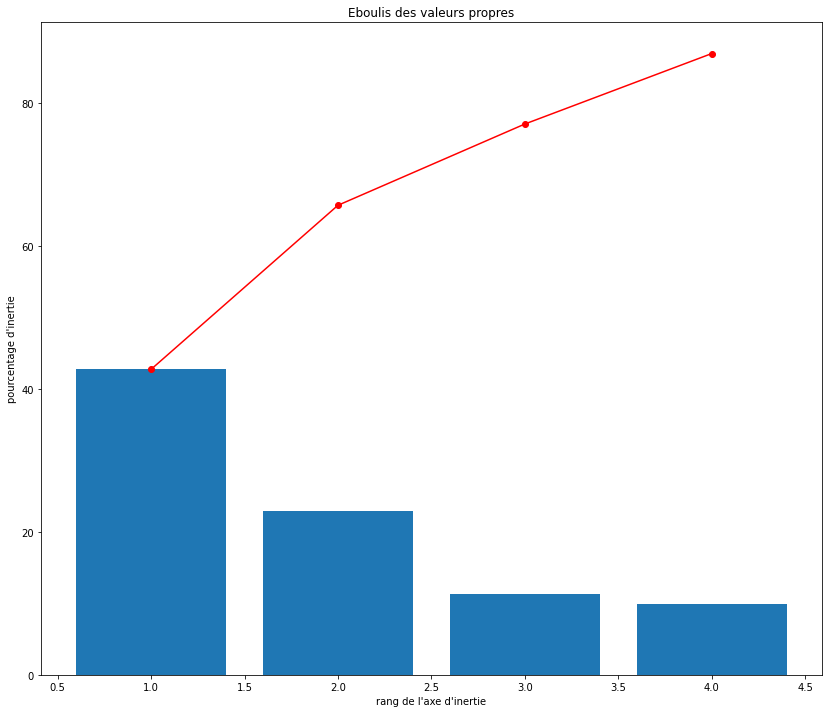

In [226]:
display_scree_plot(pca)

We will use the first 4 dimensions to summarize our data as they represent more than 80% of our explained variance.

In [227]:
#variance expliquée
eigval = pca.explained_variance_
print(eigval)

[3.42265979 1.83813451 0.91053353 0.78957813]


In [228]:
#proportion de variance expliquée
print(pca.explained_variance_ratio_)

[0.42761475 0.22964988 0.11375877 0.09864704]


### *b -* Projection

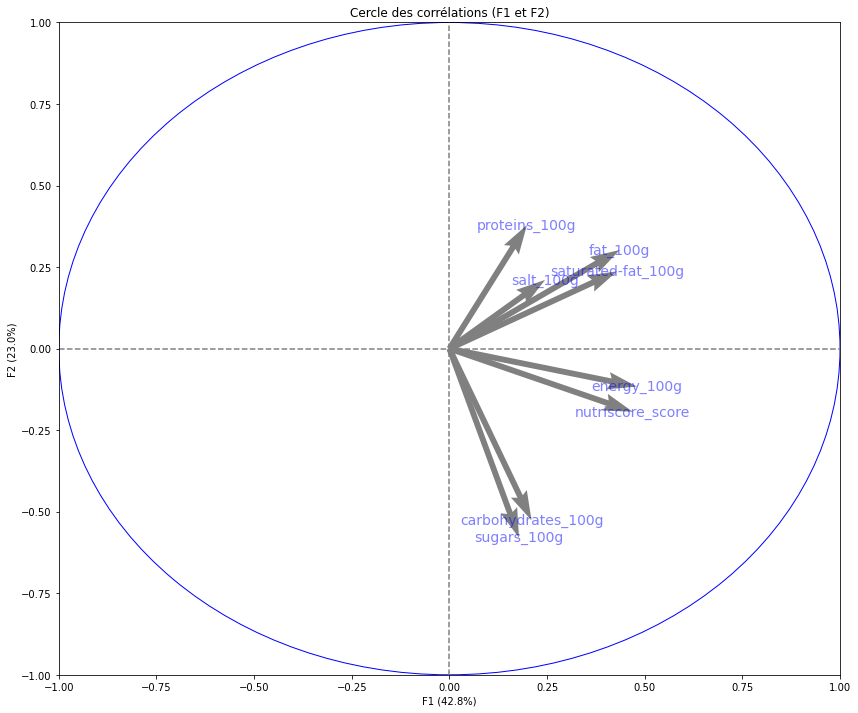

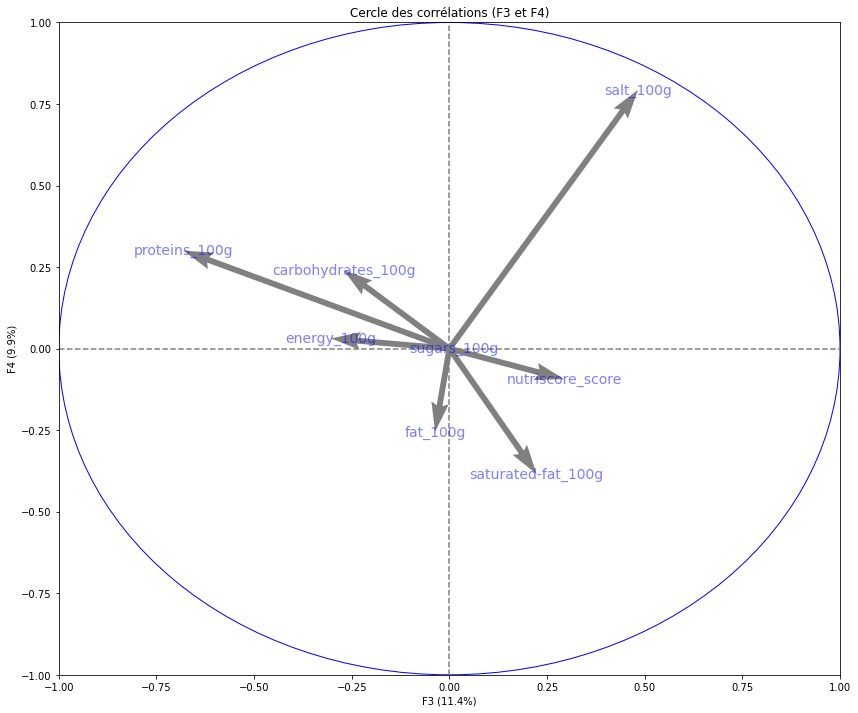

In [229]:
display_circles(pca_comp, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(features_num))

The dimensional reduction confirms our previous remarks.


*   The first determinant of the nutriscore score is the caloric content per 100 grams, a high caloric intake has been numerously pinpointed as the cause of various health conditions (obesity, diabetes, for example) and this is what is penalized by the Nutriscore.
*   The nutriscore score is also highly correlated with satured fat, but less with fat itself.
* Salt content is also correlated, althought salt seems to be a fairly independent determinant
* Finally, proteins, which might presumably be found as egg and its derivatives in this type of product, are correlated with salt, but their presence are the sign of a low nutriscore score



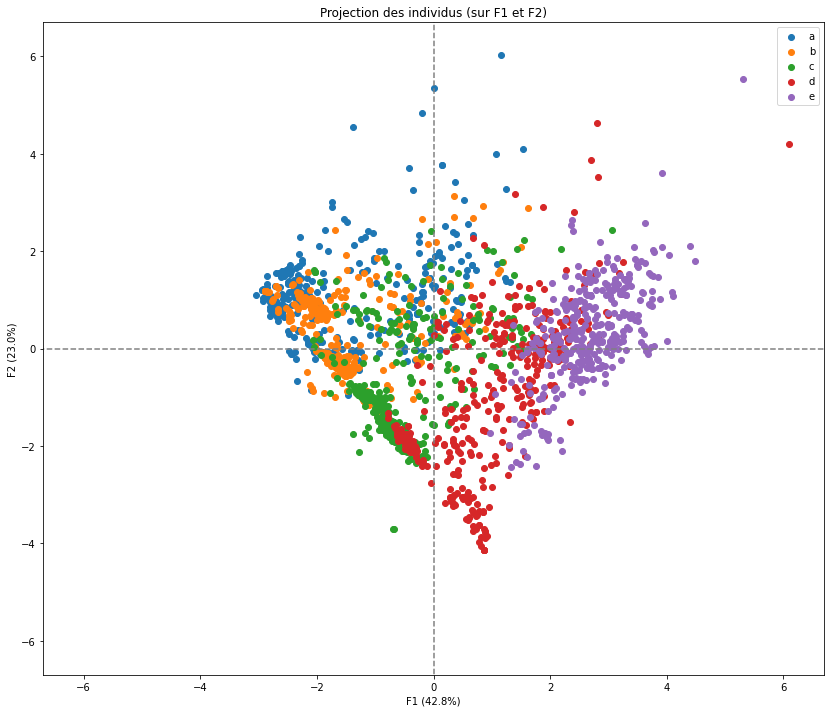

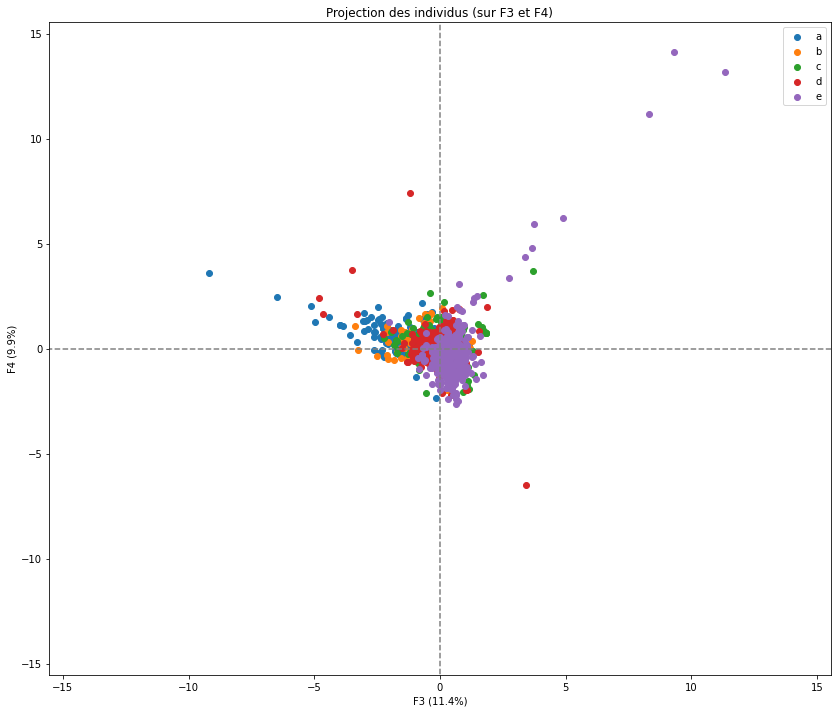

In [230]:
# Projection des individus
display_factorial_planes(X_projected, n_comp, pca, [(0,1),(2,3),(4,5)], illustrative_var=dataframe_sampled['nutriscore_grade'].values)

* We can clearly see the cloud nutriscore score repartition that goes along the nustriscore F2 axis.
* On the left hand side, low of the center of the F1 F2 graph, at the opposite of the proteins, salt and fat arrows we notice the a concentration of products that are low in the nutritional groups.
* Along the center of the F2 axis, there is a more disparate dots cloud of product with a relatively uniform and disparate distribution of nutrients, A, B and C grades are concentrated on the left hand side.
* On the F3 F4 axes, we can clearly see that the presence of proteins is linked with low nutriscores.

### *c -* Representativity

In [231]:
#vérifions la théorie - somme en ligne des cos2 = 1
print(np.sum(cos2,axis=1))

[0.96503037 0.9495844  0.78484105 ... 0.9503907  0.99164804 0.91128511]


In [232]:
#vérifions la théorie
print(np.sum(ctr,axis=0))

[0.99949109 0.99949109 0.99949109 0.99949109]


In [233]:
#le champ components_ de l'objet ACP
comp = pca.components_

In [234]:
#racine carrée des valeurs propres
sqrt_eigval = np.sqrt(eigval)

Here are the correlations between features and axes:

In [235]:
#corrélation des variables avec les axes
corvar = np.zeros((p,p))
for k in range(n_comp):
 corvar[:,k] = comp[k,:] * sqrt_eigval[k]
corr_matrix = pd.DataFrame({'feature':X.columns,'COR_1':corvar[:,0],'COR_2':corvar[:,1], 
              'COR_3':corvar[:,2], 'COR_4':corvar[:,3]}).round(2).set_index('feature')
heatmap(corr_matrix, 'Features Axis Correlations')

Here is the quality of representation of each feature for each axis:

In [236]:
#cosinus carré des variables
cos2var = corvar**2
cos_matrix = pd.DataFrame({'id':X.columns,'COS2_1':cos2var[:,0],'COS2_2':cos2var[:,1],'COS2_3':cos2var[:,2],'COS2_4':cos2var[:,3]}).set_index('id').round(2)
heatmap(cos_matrix, 'Quality of features representation')

Here are the features contributions to each axis:

In [237]:
#contributions
ctrvar = cos2var
for k in range(n_comp):
 ctrvar[:,k] = ctrvar[:,k]/eigval[k]
ctr_matrix = pd.DataFrame({'id':X.columns,'CTR_1':ctrvar[:,0],'CTR_2':ctrvar[:,1],'CTR_3':ctrvar[:,2],'CTR_4':ctrvar[:,3]}).round(2).set_index('id')
heatmap(ctr_matrix, 'Features axis contributions')

# ***5 -*** **Exploratory Analysis Conlusions**

* We have desmontrated the feasabily of our application.
* And we have managed to understand our dataset better.